In [1]:
import pandas as pd
import plotly.figure_factory as ff
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns 

# adjusting display restrictions 
pd.options.display.max_columns = 100
pd.options.display.max_rows = 3000
# setting preference to remove scientific notation 
pd.options.display.float_format = '{:,.2f}'.format

%matplotlib inline

### Importing Functions From Helper Functions Folder ([ref link](https://www.geeksforgeeks.org/python-import-module-from-different-directory/))

In [1]:
import pandas as pd
# cleaned data is posted on drive demo to pull 
url = 'https://drive.google.com/file/d/1zA-C6m7Rv9y051iVr8voieRRm-CnnzA1/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df = pd.read_csv(path)
df.head()

,unique_fire_identifier,lattitude,longitude,acres_burned,fire_cause,incident_name,IsFSAssisted,origin_county,state,year,...,area (acres),population,d0,d1,d2,d3,d4,DSCI_avg,DSCI_summed,precipitation(in)
0,2003-WYCMX-200237,-105.563067,44.603340,139.091837,Unknown,SCHWARTZ,1.0,Campbell,WY,2003,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2004-CABDU-006784,-117.076679,34.733894,1906.698008,Unknown,MENTONE,1.0,San Bernardino,CA,2004,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2008-IDGBK-000002,-116.216680,43.666673,685.728842,Unknown,NIFC RAMP SUPPORT,1.0,Ada,ID,2008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2008-IDCTF-008902,-111.426912,42.096336,20.000000,Unknown,St. Charles RX,0.0,Bear Lake,ID,2008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2008-AZPNF-000975,-112.072414,34.598306,77.946287,Unknown,Mingus/Cherry Rx,0.0,Yavapai,AZ,2008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# quickly exporting clean data to import into tableau
tableau_df = df.fillna(0)
tableau_df.isnull().sum().sum()
tableau_df.rename(columns = {'longitude':'lat','lattitude':'long'},inplace=True)
tableau_df.to_csv(index=False,path_or_buf = '../../../tableau_df.csv')
tableau_df.head()

,unique_fire_identifier,long,lat,acres_burned,fire_cause,incident_name,IsFSAssisted,origin_county,state,year,...,area (acres),population,d0,d1,d2,d3,d4,DSCI_avg,DSCI_summed,precipitation(in)
0,2003-WYCMX-200237,-105.563067,44.603340,139.091837,Unknown,SCHWARTZ,1.0,Campbell,WY,2003,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2004-CABDU-006784,-117.076679,34.733894,1906.698008,Unknown,MENTONE,1.0,San Bernardino,CA,2004,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2008-IDGBK-000002,-116.216680,43.666673,685.728842,Unknown,NIFC RAMP SUPPORT,1.0,Ada,ID,2008,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2008-IDCTF-008902,-111.426912,42.096336,20.000000,Unknown,St. Charles RX,0.0,Bear Lake,ID,2008,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2008-AZPNF-000975,-112.072414,34.598306,77.946287,Unknown,Mingus/Cherry Rx,0.0,Yavapai,AZ,2008,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Alaska, Arizona, California, Colorado, Hawaii, Idaho, Montana, Nevada, New Mexico, Oregon, Utah, Washington, Wyoming A Arkansas, Colorado, Louisiana, Montana, New Mexico, North Dakota, Oklahoma, South Dakota, Texas, Utah and Wyomingrkansas, Colorado, Louisiana, Montana, New Mexico, North Dakota, Oklahoma, South Dakota, Texas, Utah and Wyoming
df_west=df[(df['state']=='CA')|(df['state']=='AZ')|(df['state']=='OR')]

df_west.head()

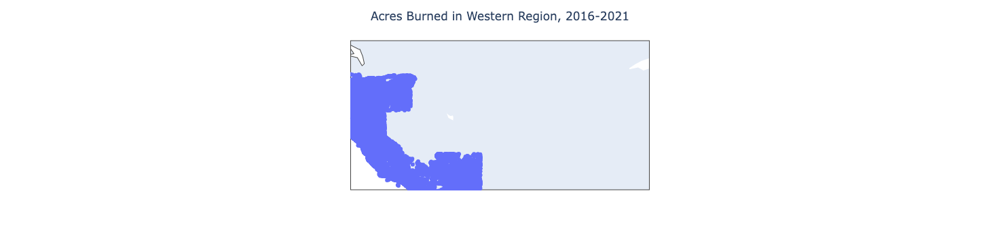

In [9]:
import plotly.express as px
import pandas as pd

fig = px.scatter_geo(df_west,lon='lattitude',lat='longitude', hover_name="acres_burned")
fig.update_layout(title = 'Acres Burned in Western Region, 2016-2021', title_x=0.5)
fig.show()

In [2]:
df_clean = df.dropna()
df_clean.isnull().sum().sum()

0

In [3]:
fire_clean_list_OG= list(df['state'].unique())
fire_clean_list= list(df_clean['state'].unique())

In [5]:
c = list(set(fire_clean_list_OG).difference(fire_clean_list))
c

['DC', 'AR', 'HI', 'AK']

We can not that dropping nulls results with quite a few states from the continental US states looks to be 5 states will not be included in the model (AR, AK, VI, HI, & RI).

In [17]:
years = df_clean['year'].unique()
years

array([2016, 2017, 2018, 2019, 2020, 2021])

We can see that the years that we will be including into models will be from the 2016 to 2021 year range. 

In [18]:
cnt=0
hist_data = []
for year in years:
    list_a = list(df_clean[df_clean['year']==year]['acres_burned'])
    #print('length of array',len(list_a[:]))
    hist_data.append(np.array(list_a, dtype=np.float32))
    #print(len(hist_data) )

In [19]:
print(type(years))
print(len(years))

years

<class 'numpy.ndarray'>
6


array([2016, 2017, 2018, 2019, 2020, 2021])

In [7]:
years = list(years.astype('str'))

Breaking up histroical data acres burned data and years to get some histogram plotted. 

In [15]:
df_clean.head()

,unique_fire_identifier,lattitude,longitude,acres_burned,fire_cause,incident_name,IsFSAssisted,origin_county,state,year,...,area (acres),population,d0,d1,d2,d3,d4,DSCI_avg,DSCI_summed,precipitation(in)
34889,2016-IDBOD-000058,-116.330913,43.406206,0.1,Human,SOUTH CLOVER,1.0,Ada,ID,2016,...,53487360.0,1684036.0,8.043333,0.000000,0.000000,0.0,0.0,8.043333,24.13,0.040772
34890,2016-MNRLA-000184,-94.916910,48.017407,0.1,Undetermined,RL 130,0.0,Beltrami,MN,2016,...,55643520.0,5525360.0,9.663333,1.026667,0.000000,0.0,0.0,11.716667,35.15,0.040886
34891,2016-MNRLA-000185,-95.015306,47.875908,0.1,Undetermined,RL 131,0.0,Beltrami,MN,2016,...,55643520.0,5525360.0,9.663333,1.026667,0.000000,0.0,0.0,11.716667,35.15,0.040886
34892,2016-AZA5S-002056,-112.761608,34.201307,0.5,Undetermined,KRISTEE,0.0,Yavapai,AZ,2016,...,72963840.0,6944767.0,32.776667,65.580000,1.170000,0.0,0.0,167.446667,502.34,0.031042
34893,2016-AZNAA-000033,-108.537233,36.744172,0.5,Human,HOGBACK 1,1.0,San Juan,NM,2016,...,77819520.0,2092555.0,53.023333,43.686667,0.086667,0.0,0.0,140.656667,421.97,0.235141


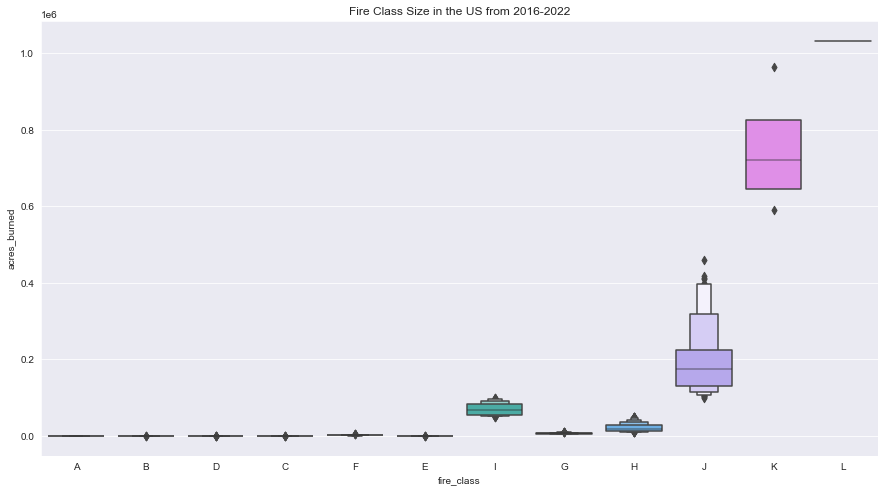

In [87]:
fire_class = []
for obs in df['acres_burned']:
    if 0<=obs <= 0.26:
        fire_class.append('A')
    elif 0.26 <= obs <10.0:
        fire_class.append('B')
    elif 10.0<=obs<100.0:
        fire_class.append('C')
    elif 100.0<=obs<300:
        fire_class.append('D')
    elif 300.0 <= obs <1_000:
        fire_class.append('E')
    elif 1_000.0<=obs<5_000.0:
        fire_class.append('F')
    elif 5_000.0 <= obs <10_000:
        fire_class.append('G')
    elif 10_000.0 <=obs<50_000:
        fire_class.append('H')
    elif 50_000.0<=obs<100_000:
        fire_class.append('I')
    elif 100_000.0<=obs<500_000.0:
        fire_class.append('J')
    elif 500_000.0 <= obs <1_000_000:
        fire_class.append('K')
    elif obs >= 1_000_000.0:
        fire_class.append('L')
    else:
        print(obs)
df['fire_class'] = fire_class 


plt.figure(figsize=(15,8))
sns.boxenplot(y=df_clean['acres_burned'],x = df_clean['fire_class']);
plt.title('Fire Class Size in the US from 2016-2022')
plt.show();

The box plot shows the distribution acres burned for each class to visibly see how much range each class represents. Clearly we know that a majority of our data will be held in classes below 5,000 acres burned even though the latter classes will contain the largest ranges. 

In [57]:

df_over500k=df_clean[(df_clean['fire_class']=="J")|(df_clean['fire_class']=="K")|(df_clean['fire_class']=="L")]
print(df_over500k.shape)
df_over500k.head()

(83, 24)


,unique_fire_identifier,lattitude,longitude,acres_burned,fire_cause,incident_name,IsFSAssisted,origin_county,state,year,month,value,anomaly,area (acres),population,d0,d1,d2,d3,d4,DSCI_avg,DSCI_summed,precipitation(in),fire_class
41322,2016-NVNNS-010080,-116.92,41.02,"122,292.00",Natural,Hot Pot,1.00,Elko,NV,2016,7,73.70,1.60,"70,762,880.00","2,919,555.00",32.97,12.57,21.42,0.26,0.00,124.71,498.84,0.02,J
43314,2016-IDBOF-000539,-115.76,43.95,"188,404.00",Undetermined,PIONEER,1.00,Boise,ID,2016,7,64.80,-0.30,"53,487,360.00","1,684,036.00",58.81,0.32,0.00,0.00,0.00,59.44,237.76,0.04,J
43866,2016-CABEU-003422,-121.90,36.46,"132,127.00",Human,SOBERANES,1.00,Monterey,CA,2016,7,76.80,2.10,"104,772,480.00","39,149,186.00",16.41,24.57,16.21,21.76,21.04,310.02,"1,240.08",0.00,J
45080,2016-WASPD-000344,-120.20,46.60,"176,600.00",Human,RANGE 12,1.00,Yakima,WA,2016,7,63.60,-0.50,"45,633,920.00","7,299,961.00",96.37,3.63,0.00,0.00,0.00,103.63,414.52,0.03,J
53899,2017-OKOKS-170025,-100.13,36.86,"150,000.00",Undetermined,Starbuck Fire,0.00,Beaver,OK,2017,3,56.20,6.90,"44,737,920.00","3,933,602.00",14.71,35.27,38.32,3.12,0.00,228.35,913.41,0.11,J


In [77]:
df_clean_CA =df_clean[df_clean['state']=='CA']

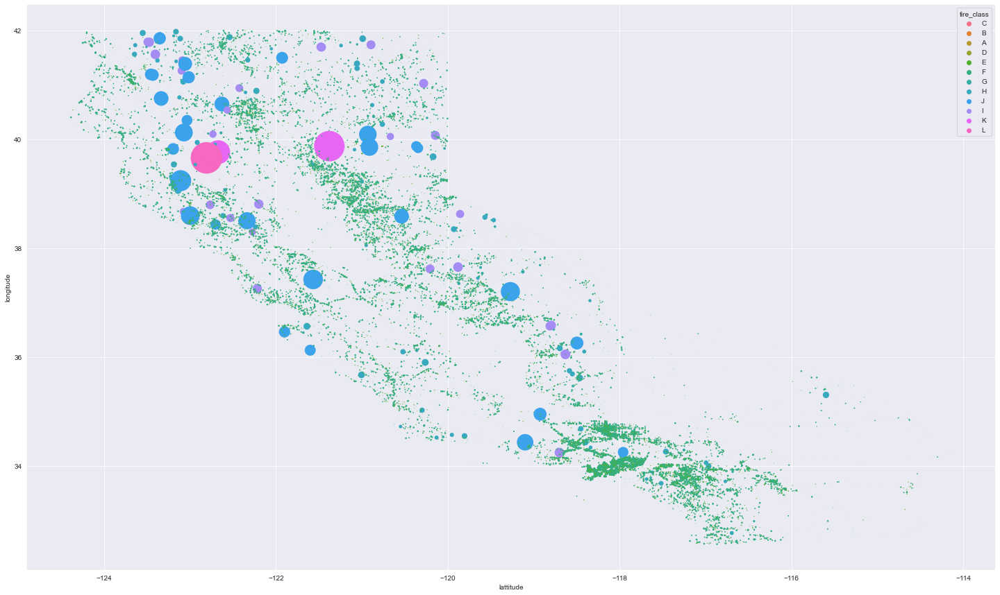

In [54]:
plt.figure(figsize=(25,15))
sns.scatterplot(x='lattitude',y='longitude',hue='fire_class',data = df_clean_CA,s=df_clean_CA['acres_burned']/500,edgecolor=None);

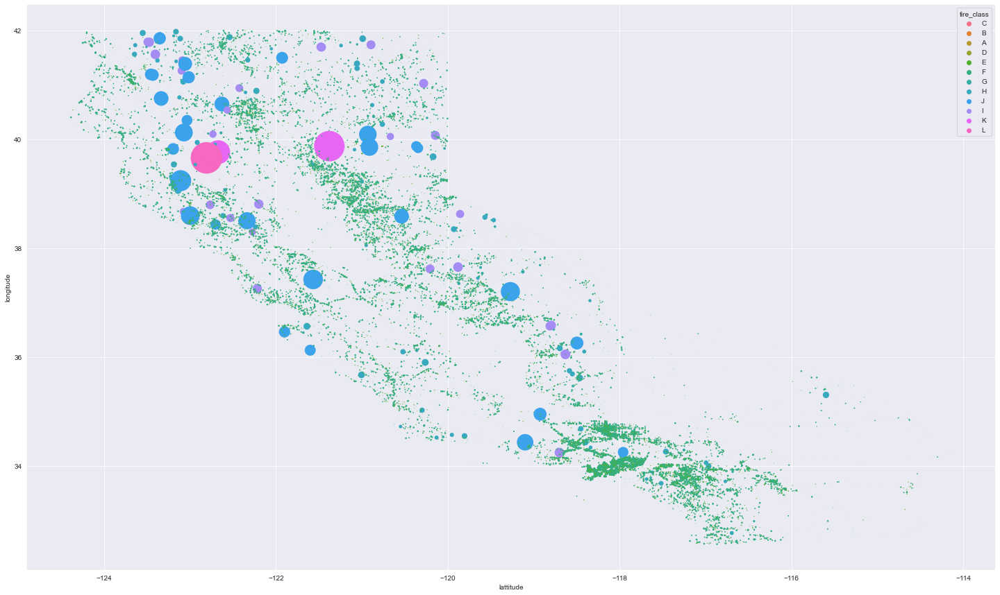

In [62]:
df_clean_CA =df_clean_CA[df_clean_CA['state']=='CA']
plt.figure(figsize=(25,15))
sns.scatterplot(x='lattitude',y='longitude',hue='fire_class',data = df_clean_CA,s=df_clean_CA['acres_burned']/500,edgecolor=None);

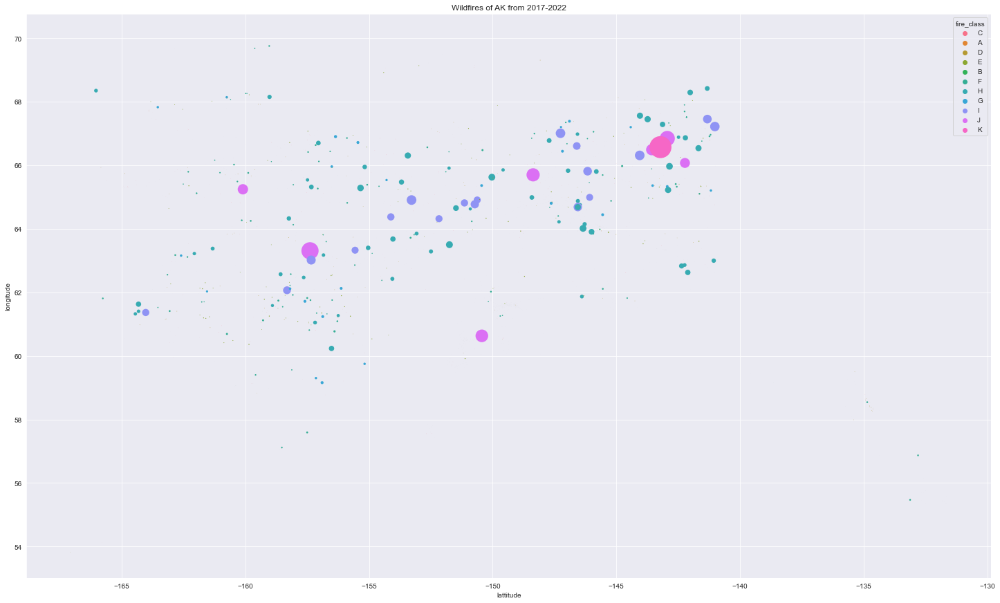

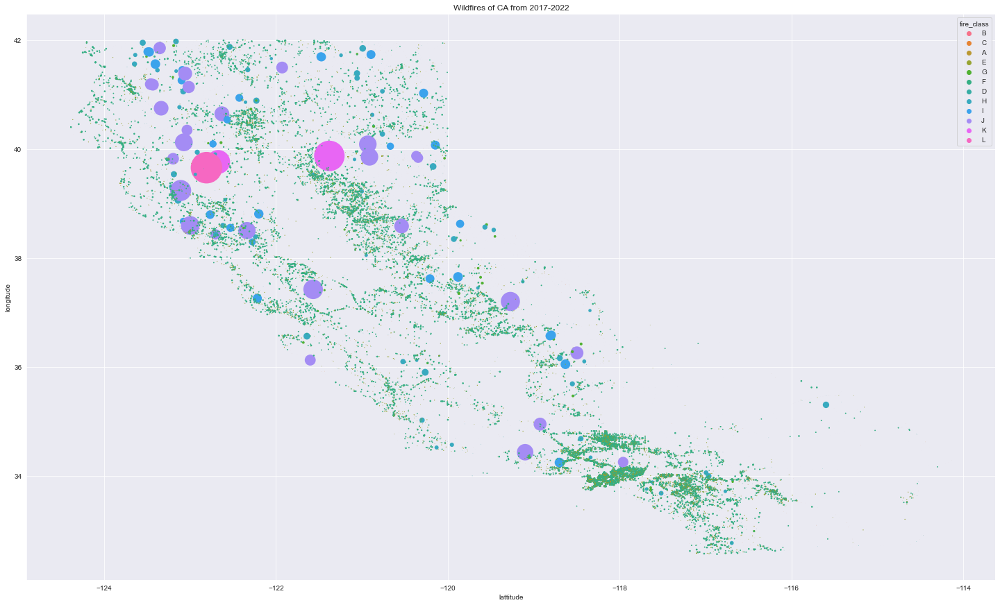

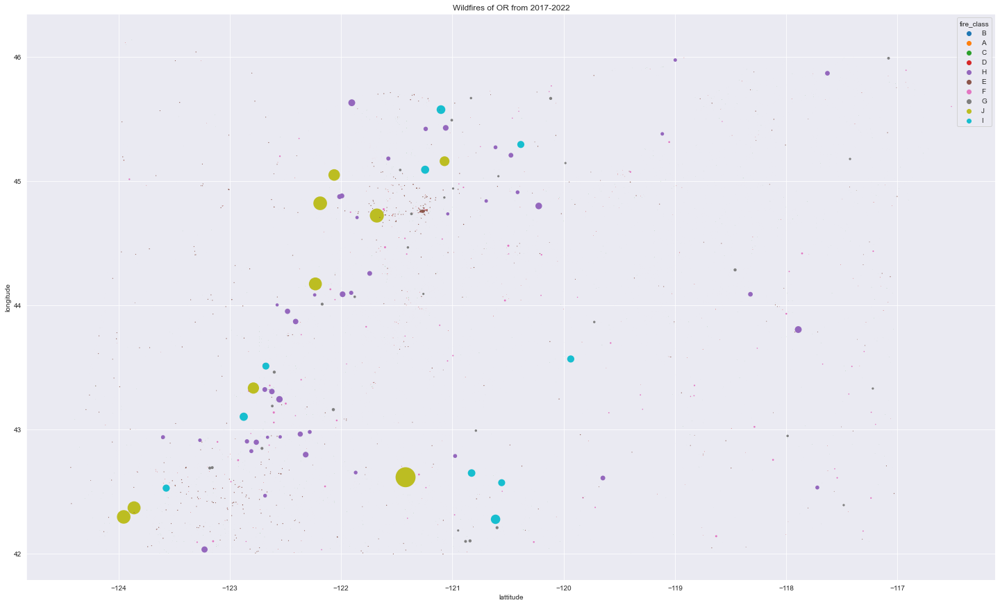

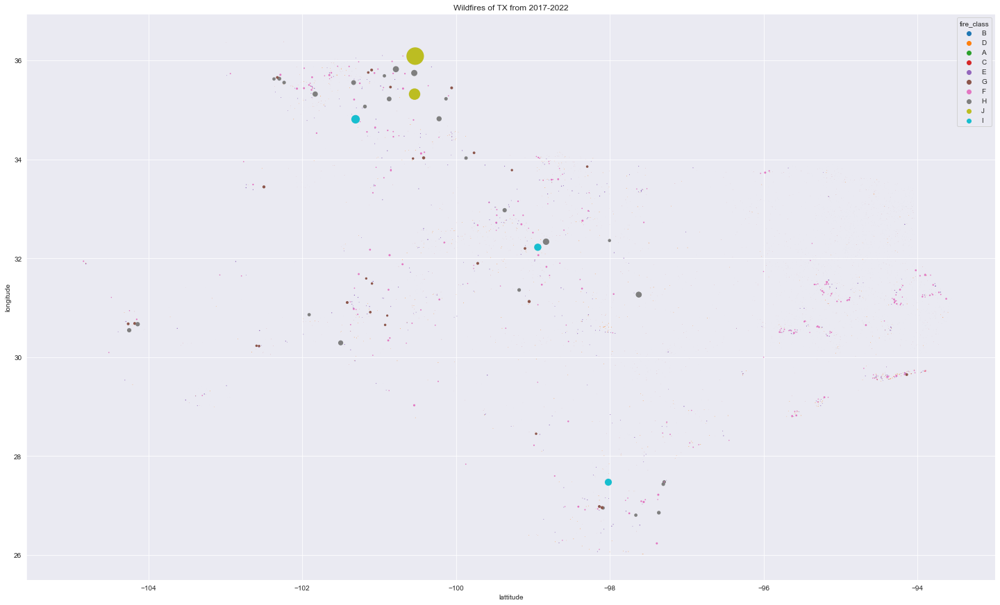

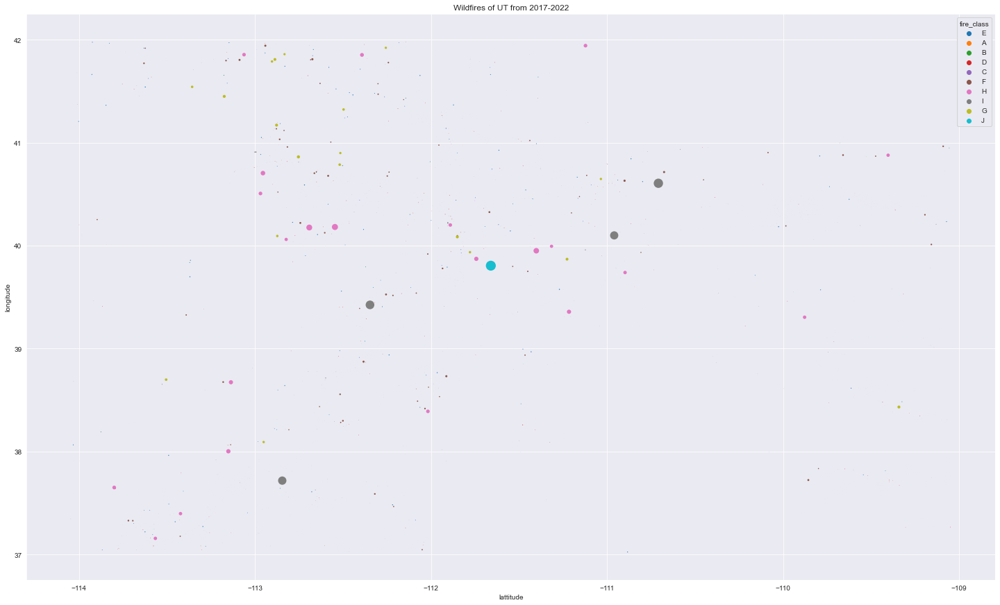

In [97]:
states_interest= ['AK', 'CA', 'OR', 'TX', 'UT']
for state in states_interest:
    state_df = df[(df['state']==state)&(df['year']>=2017)]
    plt.figure(figsize=(25,15))
    sns.scatterplot(x='lattitude',y='longitude',hue='fire_class',data = state_df,s=state_df['acres_burned']/500,edgecolor=None);
    plt.title(f'Wildfires of {state} from 2017-2022')
    plt.show();